In [1]:
import os
import h5py
import tqdm
import copy
import matplotlib.pyplot as plt
import numpy as np
from tifffile import imread, imwrite
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib

In [2]:
font = {
        'family' : 'sans-serif',
        'weight' : 'normal',
        'size'   : 7
        }
padding = {
    'titlepad': 3,
    'labelpad': 1,
}
matplotlib.rc('font', **font)
matplotlib.rc('axes', **padding)

In [3]:
data_path = '/data/duanb/'

In [4]:
datasets = {
    'Brainbow': imread(data_path + 'Brainbow/nTracer_sample.tif'),
    'NeuN': imread(data_path + 'NeuN/20211223_HDCF_R54-4_fibers11-16_hiRes_NeuN_histMatched_medianFilt.tif'),
    'EM': imread(data_path + 'EM/image.tif'),
    'DRAQ5': imread(data_path + 'DRAQ5/coord_-5.4,+18.6_2_1X.tif'),
    'STORM': imread(data_path + 'STORM/Aquired STORM.tif'),
}

for k, v in datasets.items():
    print(k, v.shape, v.dtype)

Brainbow (136, 4, 512, 512) uint16
NeuN (497, 1500, 3000) uint16
EM (500, 500, 500) uint8
DRAQ5 (1000, 2240, 2240) uint16
STORM (40000, 256, 256) uint16


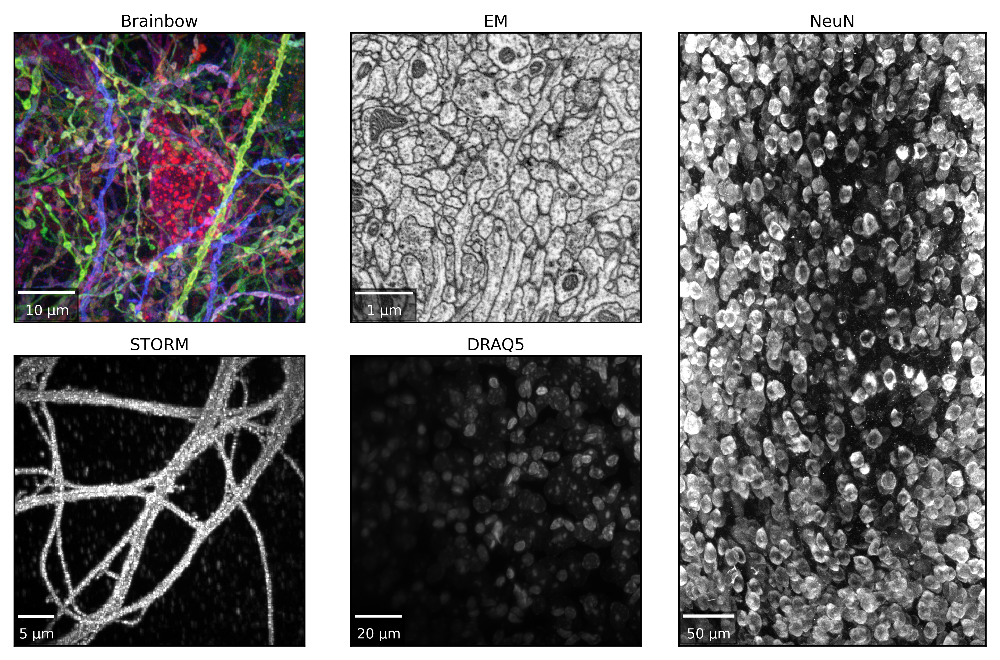

In [8]:
fig, axes = plt.subplots(2, 3, figsize=(7.2,4.65), dpi=600)

for ax in axes.ravel():
    ax.set_xticks([])
    ax.set_yticks([])
    
img = datasets['Brainbow']
# maxium projection
img = img[:, ...]
img = np.amax(img, axis=0)
img = img * 1.0
ax = axes[0,0]
for i in range(img.shape[0]):
    img[i] /= img[i].max()
img = np.moveaxis(img,0,-1)
ax.set_title("Brainbow")
ax.imshow(img[...,:3])
del img
    
img = datasets['EM']
ax = axes[0,1]
img = img[0, ...]
ax.set_title("EM")
ax.imshow(img, cmap='gray')
del img

img = datasets['STORM']
# maxium projection
img = img[:, ...]
img = np.amax(img, axis=0)
ax = axes[1,0]
ax.set_title("STORM")
ax.imshow(img, cmap='gray')
del img

img = datasets['DRAQ5']
img = img[:, ...]
img = np.amax(img, axis=0)
ax = axes[1,1]
ax.set_title("DRAQ5")
ax.imshow(img, cmap='gray')
del img


gs = axes[0, 2].get_gridspec()
for ax in axes[:, -1]:
    ax.remove()
ax = fig.add_subplot(gs[:, -1])
img = datasets['NeuN']
img = img[:, ...]
img = np.amax(img, axis=0)
ax.set_title("NeuN")
ax.imshow(img.T, cmap='gray')
ax.set_xticks([])
ax.set_yticks([])
del img

#NeuN
ax.add_artist(ScaleBar(0.202, 'um', location='lower left', box_color='k', box_alpha=0.5, color='w', width_fraction=0.005))

#brainbow
axes[0, 0].add_artist(ScaleBar(0.1, 'um', location='lower left', box_color='k', box_alpha=0.5, color='w', width_fraction=0.01))
#EM
axes[0, 1].add_artist(ScaleBar(10, 'nm', location='lower left', box_color='k', box_alpha=0.5, color='w', width_fraction=0.01))
#STORM
axes[1, 0].add_artist(ScaleBar(160 , 'nm', location='lower left', box_color='k', box_alpha=0.5, color='w', width_fraction=0.01))
#DRAQ5
axes[1, 1].add_artist(ScaleBar(100/1.8, 'nm', location='lower left', box_color='k', box_alpha=0.5, color='w', width_fraction=0.01))

fig.tight_layout()
fig.savefig("overview.pdf")